## SVC
- This notebook contains the implementation of Support Vector Classifier model.
- It is a seperate notebook, because this model is trained on gpu. So to maintain the modularity of my scripts, i have used this seperate notebook and executed on another device.
- Their is not direct implementation of svc on gpu, i have made a svc like model based on neural network.
- I learned this technique from,
    article : https://www.datasciencebase.com/supervised-ml/algorithms/support-vector-machines/pytorch-example/

In [1]:
import numpy as np
import pandas as pd
from sklearn.svm import SVC
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from sklearn.datasets import make_classification
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import seaborn as sns

### Load and Prepare Data

In [2]:
data = pd.read_csv('D:/certificates/ML Stuti/data/processed/preprocessed_data.csv')
X = data.drop(columns=['readmitted', 'age', 'diag_1', 'diag_2', 'diag_3', 'diag_1_cat', 'diag_2_cat', 'diag_3_cat'], errors='ignore')
y = data['readmitted']
# Split dataset into train and test
from sklearn.model_selection import train_test_split as sk_train_test_split
X_train, X_test, y_train, y_test = sk_train_test_split(X, y, test_size=0.2, random_state=42)

# smote
from imblearn.over_sampling import SMOTE

smote = SMOTE(random_state=42)
X_train_res, y_train_res = smote.fit_resample(X_train, y_train)


# Standardize features
scaler = StandardScaler()
X_train_res = scaler.fit_transform(X_train_res)
X_test_scaled = scaler.transform(X_test)

### Move Data to GPU

In [ ]:
from imblearn.over_sampling import ADASYN
import torch
import numpy as np
import pandas as pd

# Ensure input is NumPy array
X_train_np = X_train_res.to_numpy() if isinstance(X_train_res, (pd.DataFrame, pd.Series)) else X_train_res
y_train_np = y_train_res.to_numpy() if isinstance(y_train_res, (pd.DataFrame, pd.Series)) else y_train_res

# Apply ADASYN
adasyn = ADASYN(sampling_strategy='minority', random_state=42)
X_res, y_res = adasyn.fit_resample(X_train_np, y_train_np)

# Convert to torch tensors (GPU)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

X_train_gpu = torch.tensor(X_res, dtype=torch.float32).to(device)
y_train_gpu = torch.tensor(y_res, dtype=torch.float32).to(device)  # BCE needs float

X_test_np = X_test_scaled.to_numpy() if isinstance(X_test_scaled, (pd.DataFrame, pd.Series)) else X_test_scaled
y_test_np = y_test.to_numpy() if isinstance(y_test, (pd.DataFrame, pd.Series)) else y_test

X_test_gpu = torch.tensor(X_test_np, dtype=torch.float32).to(device)
y_test_gpu = torch.tensor(y_test_np, dtype=torch.float32).to(device)

### Train cuSVC Model on GPU

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from imblearn.over_sampling import ADASYN
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt


training_args = {
    "epochs": 50,
    "learning_rate": 0.01,
    "batch_size": 16,
    "device": "cuda",
}

device = torch.device(training_args["device"] if torch.cuda.is_available() else "cpu")

# SAFE CONVERSION TO NUMPY
def to_numpy(data):
    return data.to_numpy() if isinstance(data, (pd.DataFrame, pd.Series)) else data

X_train_np = to_numpy(X_train_res)
y_train_np = to_numpy(y_train_res)
X_test_np  = to_numpy(X_test_scaled)
y_test_np  = to_numpy(y_test)

# BALANCE WITH ADASYN
adasyn = ADASYN(sampling_strategy='minority', random_state=42)
X_res, y_res = adasyn.fit_resample(X_train_np, y_train_np)

# CONVERT TO TORCH TENSORS
X_train_gpu = torch.tensor(X_res, dtype=torch.float32).to(device)
y_train_gpu = torch.tensor(y_res, dtype=torch.float32).to(device)
X_test_gpu  = torch.tensor(X_test_np, dtype=torch.float32).to(device)
y_test_gpu  = torch.tensor(y_test_np, dtype=torch.float32).to(device)

# SVM-LIKE MODEL USING TORCH
class SVM_Like(nn.Module):
    def __init__(self, input_dim):
        super().__init__()
        self.linear = nn.Linear(input_dim, 1)

    def forward(self, x):
        return self.linear(x)

model = SVM_Like(X_train_gpu.shape[1]).to(device)

# LOSS AND OPTIMIZER
criterion = nn.BCEWithLogitsLoss()  # Sigmoid + BCE works like SVC probability
optimizer = optim.Adam(model.parameters(), lr=training_args["learning_rate"])

# MINI-BATCH TRAINING
dataset = torch.utils.data.TensorDataset(X_train_gpu, y_train_gpu)
loader = torch.utils.data.DataLoader(dataset, batch_size=training_args["batch_size"], shuffle=True)

for epoch in range(training_args["epochs"]):
    running_loss = 0.0
    for step, (X_batch, y_batch) in enumerate(loader, start=1):
        optimizer.zero_grad()
        outputs = model(X_batch).squeeze()
        loss = criterion(outputs, y_batch)
        loss.backward()
        optimizer.step()

        running_loss += loss.item()
        print(f"Step [{step}/{len(loader)}], Loss: {loss.item():.4f}")

    print(f"Epoch [{epoch+1}/{training_args['epochs']}], Average Loss: {running_loss/len(loader):.4f}")

print("Training complete")

Step [1/9043], Loss: 0.7259
Step [2/9043], Loss: 0.7651
Step [3/9043], Loss: 0.8004
Step [4/9043], Loss: 0.6406
Step [5/9043], Loss: 0.7194
Step [6/9043], Loss: 0.6994
Step [7/9043], Loss: 0.7522
Step [8/9043], Loss: 0.7303
Step [9/9043], Loss: 0.6857
Step [10/9043], Loss: 0.6195
Step [11/9043], Loss: 0.6618
Step [12/9043], Loss: 0.6929
Step [13/9043], Loss: 0.6665
Step [14/9043], Loss: 0.6919
Step [15/9043], Loss: 0.6567
Step [16/9043], Loss: 0.5936
Step [17/9043], Loss: 0.6213
Step [18/9043], Loss: 0.5880
Step [19/9043], Loss: 0.7139
Step [20/9043], Loss: 0.6729
Step [21/9043], Loss: 0.6869
Step [22/9043], Loss: 0.5625
Step [23/9043], Loss: 0.5493
Step [24/9043], Loss: 0.6972
Step [25/9043], Loss: 0.5413
Step [26/9043], Loss: 0.6606
Step [27/9043], Loss: 0.6810
Step [28/9043], Loss: 0.5442
Step [29/9043], Loss: 0.5942
Step [30/9043], Loss: 0.5785
Step [31/9043], Loss: 0.5753
Step [32/9043], Loss: 0.6327
Step [33/9043], Loss: 0.5716
Step [34/9043], Loss: 0.7242
Step [35/9043], Loss: 0

### Predictions and Evaluation

Accuracy: 0.7214

Classification Report:
               precision    recall  f1-score   support

         0.0       0.90      0.77      0.83     18069
         1.0       0.15      0.31      0.20      2285

    accuracy                           0.72     20354
   macro avg       0.52      0.54      0.52     20354
weighted avg       0.81      0.72      0.76     20354

Confusion Matrix:
[[13968  4101]
 [ 1570   715]]


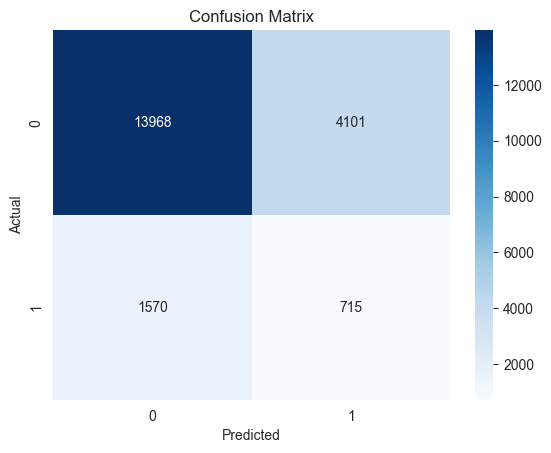

In [6]:
# Forward pass
with torch.no_grad():
    outputs = model(X_test_gpu).squeeze()  # raw scores
    y_pred_gpu = torch.sigmoid(outputs)    # convert logits to probabilities
    y_pred_gpu = (y_pred_gpu > 0.5).long() # convert probs to 0/1 labels

# Move back to CPU for sklearn metrics
y_pred = y_pred_gpu.cpu().numpy()
y_test_cpu = y_test_gpu.cpu().numpy()

# Evaluate
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

accuracy = accuracy_score(y_test_cpu, y_pred)
print(f"Accuracy: {accuracy:.4f}")
print("\nClassification Report:\n", classification_report(y_test_cpu, y_pred))

cm = confusion_matrix(y_test_cpu, y_pred)
print("Confusion Matrix:")
print(cm)

# Optional: Plot confusion matrix
import seaborn as sns
import matplotlib.pyplot as plt
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.title("Confusion Matrix")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()

In [ ]:
print("\n--- Saving the best model ---")
model_save_path = 'svm_model.pth'
torch.save(model.state_dict(), model_save_path)
print(f"Model state dictionary saved to {model_save_path}")


--- Saving the best model ---
Model state dictionary saved to best_svm_model.pth


- The f1 score for minority class (target) is less than the random forest model